<a href="https://colab.research.google.com/github/manojkumarshenu/Cognifyz_ML_internship/blob/main/task4(Location_based_Analysis).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/drive/MyDrive/almabetter 1/datasets/Dataset .csv')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [ ]:
missing_values= df.isnull().sum()
missing_values

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [ ]:
import folium

# Create a map centered around the mean coordinates
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add points to the map
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
    ).add_to(restaurant_map)

restaurant_map

In [ ]:
# Save the map to an HTML file
map_path = 'restaurant_map.html'
restaurant_map.save(map_path)

map_path

'restaurant_map.html'

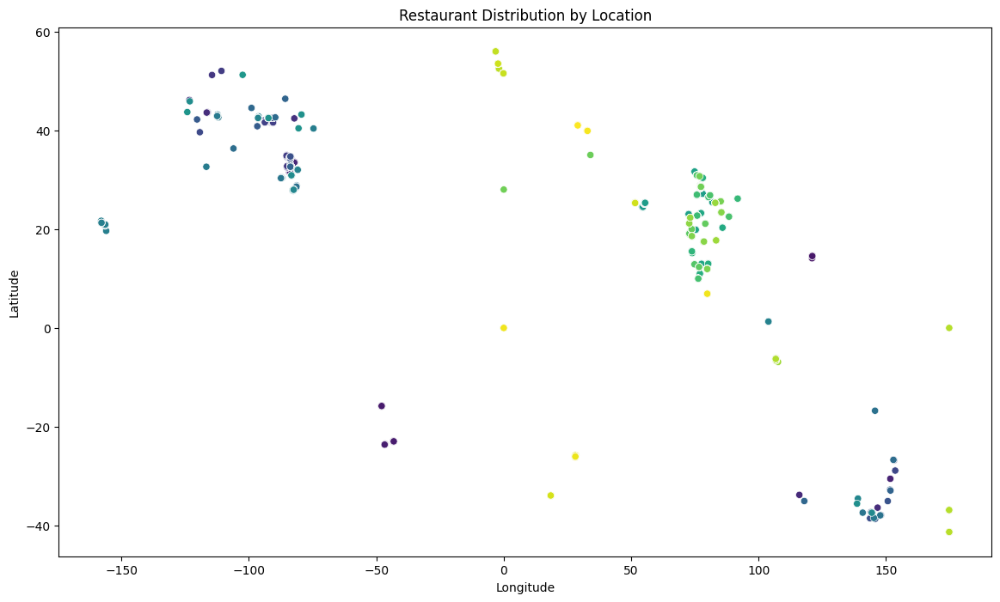

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the plot size
plt.figure(figsize=(14, 8))

# Create a scatter plot for the restaurant locations
sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='City', palette='viridis', legend=None)

# Add plot title and labels
plt.title('Restaurant Distribution by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


In [ ]:
city_grouped = df.groupby('City').agg({
    'Restaurant ID': 'count',
    'Aggregate rating': 'mean',
    'Cuisines': 'nunique',
    'Price range': 'mean'
}).reset_index()

# Rename columns for better understanding
city_grouped.columns = ['City', 'Number of Restaurants', 'Average Rating', 'Number of Cuisines', 'Average Price Range']

# Display the grouped data
print(city_grouped.sort_values(by='Number of Restaurants', ascending=False))


            City  Number of Restaurants  Average Rating  Number of Cuisines  \
88     New Delhi                   5473        2.438845                 892   
50       Gurgaon                   1118        2.651431                 362   
89         Noida                   1080        2.036204                 248   
43     Faridabad                    251        1.866932                  87   
48     Ghaziabad                     25        2.852000                  18   
..           ...                    ...             ...                 ...   
37   Dicky Beach                      1        3.600000                   1   
68          Lorn                      1        3.600000                   1   
107  Quezon City                      1        4.800000                   1   
66       Lincoln                      1        4.500000                   1   
65      Lakeview                      1        3.600000                   1   

     Average Price Range  
88              1.621597

In [ ]:
# Group the data by city
city_grouped = df.groupby('City').agg({
    'Restaurant ID': 'count',
    'Aggregate rating': 'mean',
    'Cuisines': 'nunique',
    'Price range': 'mean'
}).reset_index()

# Rename columns for better understanding
city_grouped.columns = ['City', 'Number of Restaurants', 'Average Rating', 'Number of Cuisines', 'Average Price Range']

# Display the grouped data
city_grouped.sort_values(by='Number of Restaurants', ascending=False)


,City,Number of Restaurants,Average Rating,Number of Cuisines,Average Price Range
88,New Delhi,5473,2.438845,892,1.621597
50,Gurgaon,1118,2.651431,362,1.855993
89,Noida,1080,2.036204,248,1.601852
43,Faridabad,251,1.866932,87,1.454183
48,Ghaziabad,25,2.852000,18,1.800000
...,...,...,...,...,...
37,Dicky Beach,1,3.600000,1,1.000000
68,Lorn,1,3.600000,1,2.000000
107,Quezon City,1,4.800000,1,3.000000
66,Lincoln,1,4.500000,1,2.000000
